In [49]:
# Import necessary libraries
import os
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models, transforms
import scipy.ndimage as nd
from PIL import Image
from tqdm import tqdm
import matplotlib.pyplot as plt
from IPython.display import display, clear_output

# Set up device (GPU if available, otherwise CPU)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")
if device.type == 'cuda':
    print(f"GPU: {torch.cuda.get_device_name(0)}")

# Create directory to save results
os.makedirs("dream_results", exist_ok=True)

# Configure matplotlib for better visualization
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'viridis'

Using device: cuda
GPU: NVIDIA GeForce RTX 4080 SUPER


In [50]:
class DeepDream:
    def __init__(self, layers=None):
        """
        Initialize the DeepDream model with specified layers.
        
        Args:
            layers: List of layer names to use. If None, uses default layers.
        """
        # Load pre-trained InceptionV3
        self.base_model = models.inception_v3(pretrained=True, transform_input=True)
        self.base_model.eval()
        self.base_model.to(device)
        
        # Map TensorFlow-style names to PyTorch layer names for convenience
        self.layer_mapping = {
            # Map common tensorflow names to PyTorch paths
            'mixed_3b': 'Mixed_3b',
            'mixed_4a': 'Mixed_4a', 
            'mixed_4b': 'Mixed_4b',
            'mixed_4c': 'Mixed_4c',
            'mixed_4d': 'Mixed_4d',
            'mixed_4e': 'Mixed_4e',
            'mixed_5a': 'Mixed_5a',
            'mixed_5b': 'Mixed_5b',
            'mixed_6a': 'Mixed_6a',
            'mixed_6b': 'Mixed_6b',
            'mixed_6c': 'Mixed_6c',
            'mixed_6d': 'Mixed_6d',
            'mixed_6e': 'Mixed_6e',
            'mixed_7a': 'Mixed_7a',
            'mixed_7b': 'Mixed_7b',
            'mixed_7c': 'Mixed_7c',
        }
        
        # Default layers if none specified - using PyTorch naming
        if layers is None:
            self.layers = ['Mixed_5b', 'Mixed_6a', 'Mixed_6b', 'Mixed_7c']
        else:
            # Convert TensorFlow-style names to PyTorch names if needed
            self.layers = []
            for layer in layers:
                if layer in self.layer_mapping:
                    self.layers.append(self.layer_mapping[layer])
                else:
                    self.layers.append(layer)
            
        print(f"Model initialized with layers: {self.layers}")
        
        # Store outputs of layers
        self.outputs = {}
        self.hooks = []
        
        # Register hooks for layer outputs
        self._register_hooks()
        
        # Model requires specific preprocessing
        self.mean = np.array([0.485, 0.456, 0.406])
        self.std = np.array([0.229, 0.224, 0.225])
        
    def _register_hooks(self):
        """Register hooks to capture outputs of network layers."""
        def hook_function(name):
            def hook(module, input, output):
                self.outputs[name] = output
            return hook
        
        # Clear any existing hooks
        for hook in self.hooks:
            hook.remove()
        self.hooks = []
        
        # Get all modules to find the layers
        for name, module in self.base_model.named_modules():
            # Register hook for any layer in our target layers
            if name in self.layers:
                handle = module.register_forward_hook(hook_function(name))
                self.hooks.append(handle)
        
        # Verify hooks are registered
        if not self.hooks:
            print("Warning: No hooks registered. Available modules:")
            for name, module in self.base_model.named_modules():
                if isinstance(module, torch.nn.Conv2d) or isinstance(module, torch.nn.MaxPool2d) or isinstance(module, torch.nn.AvgPool2d) or 'Mixed' in name:
                    print(f"- {name}")
    
    def preprocess(self, img_array):
        """Convert a numpy array (HxWxC, RGB) to a PyTorch tensor."""
        # Convert to float32 and normalize to [0, 1]
        img_float = img_array.astype(np.float32) / 255.0
    
        # Apply normalization according to ImageNet stats
        img_normalized = img_float.copy()
        for i in range(3):
            img_normalized[:, :, i] = (img_float[:, :, i] - self.mean[i]) / self.std[i]
        
        # Convert to tensor format (CxHxW)
        # IMPORTANT: Explicitly convert to float32
        img_tensor = torch.from_numpy(img_normalized.transpose(2, 0, 1)).float().to(device)
    
        # Add batch dimension
        return img_tensor.unsqueeze(0)
    
    def deprocess(self, tensor):
        """Convert a PyTorch tensor back to a numpy array (HxWxC, RGB)."""
        # Remove batch dimension, move to CPU, convert to numpy
        img = tensor.squeeze(0).cpu().detach().numpy()
        
        # Transpose from CxHxW to HxWxC
        img = img.transpose(1, 2, 0)
        
        # Denormalize
        for i in range(3):
            img[:, :, i] = img[:, :, i] * self.std[i] + self.mean[i]
        
        # Clip to valid range and convert to uint8
        img = np.clip(img * 255.0, 0, 255).astype(np.uint8)
        return img
    
    def add_random_jitter(self, img_tensor, jitter=32):
        """Add random jitter to help break grid patterns."""
        # Get random shift amounts
        ox, oy = np.random.randint(-jitter, jitter+1, 2)
        
        # Apply the shift by rolling the tensor
        img_shifted = torch.roll(torch.roll(img_tensor, ox, dims=3), oy, dims=2)
        
        return img_shifted, (ox, oy)
    
    def remove_jitter(self, img_tensor, jitter_shift):
        """Remove the random jitter."""
        ox, oy = jitter_shift
        img = torch.roll(torch.roll(img_tensor, -ox, dims=3), -oy, dims=2)
        return img
    
    def calc_loss(self, activations):
        """Calculate loss to maximize activations - FIX: return proper tensor."""
        # Initialize with a proper tensor
        loss = torch.tensor(0.0, device=device)
        
        for name, activation in activations.items():
            # Square activations to enhance effect and sum them
            # This creates a stronger effect than just mean
            layer_loss = torch.sum(activation ** 2)
            loss = loss + layer_loss
        
        return loss
    
    def calc_loss_guided(self, current_activations, guide_activations, guidance_weight=0.5):
        """Calculate loss for guided dreaming - FIX: proper tensor operations."""
        # Standard loss (maximize activation)
        standard_loss = torch.tensor(0.0, device=device)
        
        for name, activation in current_activations.items():
            standard_loss = standard_loss + torch.sum(activation ** 2)
        
        # Guide loss (maximize similarity to guide features)
        guide_loss = torch.tensor(0.0, device=device)
        
        for name in current_activations:
            if name in guide_activations:
                current = current_activations[name]
                guide = guide_activations[name]
                
                # Normalize activations
                current_norm = current / (torch.std(current) + 1e-8)
                guide_norm = guide / (torch.std(guide) + 1e-8)
                
                # Calculate similarity
                b, ch, h, w = current.shape
                current_flat = current_norm.view(b, ch, -1)
                guide_flat = guide_norm.view(b, ch, -1)
                
                # Matrix of dot products
                similarity = torch.bmm(current_flat, guide_flat.transpose(1, 2))
                
                # Find max similarity for each position
                max_sim = torch.max(similarity, dim=2)[0]
                guide_loss = guide_loss + torch.sum(max_sim)
        
        # Combine losses based on guidance weight
        combined_loss = (1 - guidance_weight) * standard_loss + guidance_weight * guide_loss
        
        return combined_loss
    
    def gradient_ascent_step(self, img_tensor, guide_activations=None, 
                           guidance_weight=0.0, step_size=0.01, jitter=32):
        """Perform one step of gradient ascent to maximize neural activations."""
        # Add random jitter
        img_jittered, jitter_shift = self.add_random_jitter(img_tensor, jitter)
        
        # Create a differentiable copy
        img_var = img_jittered.detach().requires_grad_(True)
        
        # Forward pass through model
        _ = self.base_model(img_var)
        
        # Get activations for our target layers
        current_activations = {name: self.outputs[name] for name in self.layers if name in self.outputs}
        
        # Make sure we have activations
        if not current_activations:
            print(f"Warning: No activations found for layers {self.layers}")
            print(f"Available layers: {list(self.outputs.keys())}")
            return img_tensor
        
        # Calculate loss
        if guide_activations is None:
            loss = self.calc_loss(current_activations)
        else:
            loss = self.calc_loss_guided(current_activations, guide_activations, guidance_weight)
        
        # Backward pass
        loss.backward()
        
        # Get and normalize gradients
        if img_var.grad is None:
            print("Warning: No gradients calculated. Returning original image.")
            return img_tensor
        
        grads = img_var.grad.clone()
        grads_std = torch.std(grads)
        if grads_std > 0:
            grads = grads / (grads_std + 1e-8)
        
        # Apply gradients - use larger step size for stronger effect
        with torch.no_grad():
            img_updated = img_var + grads * step_size
        
        # Remove jitter
        img_result = self.remove_jitter(img_updated, jitter_shift)
        
        # Clip to valid range
        std_tensor = torch.tensor(self.std, device=device)
        mean_tensor = torch.tensor(self.mean, device=device)
        
        img_result = torch.clamp(
            img_result, 
            -mean_tensor.view(3, 1, 1) / std_tensor.view(3, 1, 1),
            (1.0 - mean_tensor.view(3, 1, 1)) / std_tensor.view(3, 1, 1)
        )
        
        return img_result
    
    def extract_guide_activations(self, guide_img):
        """Extract activations from guide image."""
        with torch.no_grad():
            _ = self.base_model(guide_img)
            guide_activations = {name: self.outputs[name].detach().clone() 
                               for name in self.layers if name in self.outputs}
        return guide_activations
    
    def process_octaves(self, img, guide_img=None, guidance_weight=0.0,
                       octave_scale=1.4, num_octaves=4, iterations_per_octave=10,
                       step_size=0.01, jitter=32, tile_size=512, show_progress=True):
        """
        Process image through multiple octaves (scales) for deepdream effect.
        """
        # Original image shape
        orig_shape = img.shape[2:]
        
        # Extract guide activations if guide image provided
        guide_activations = None
        if guide_img is not None:
            guide_activations = self.extract_guide_activations(guide_img)
        
        # Prepare octave pyramid base images (downscale)
        octaves = [img]
        for i in range(num_octaves - 1):
            # Calculate size for this octave
            octave_size = [
                int(img.shape[2] / (octave_scale ** (i + 1))),
                int(img.shape[3] / (octave_scale ** (i + 1)))
            ]
            # Make sure dimensions don't get too small
            octave_size = [max(size, 32) for size in octave_size]
            
            # Downscale the image
            scaled_img = torch.nn.functional.interpolate(
                img, size=octave_size, mode='bicubic', align_corners=False
            )
            octaves.append(scaled_img)
        
        # Process octaves from smallest to largest
        detail = torch.zeros_like(octaves[-1])
        
        for octave, octave_base in enumerate(reversed(octaves)):
            print(f"Processing octave {octave+1}/{num_octaves}")
            h, w = octave_base.shape[2:4]
            
            # Resize detail from previous octave if needed
            if octave > 0:
                # Calculate target size
                target_size = (octave_base.shape[2], octave_base.shape[3])
                
                # Upscale detail to match current octave size
                detail = torch.nn.functional.interpolate(
                    detail, size=target_size, mode='bicubic', align_corners=False
                )
            
            # Add detail to base
            input_tensor = octave_base + detail
            
            # Gradient ascent steps
            for i in tqdm(range(iterations_per_octave), disable=not show_progress):
                # Apply gradient ascent
                updated = self.gradient_ascent_step(
                    input_tensor, 
                    guide_activations=guide_activations,
                    guidance_weight=guidance_weight,
                    step_size=step_size * (1.0 + octave/5.0),  # Increase step size for larger octaves
                    jitter=min(jitter, min(h, w) // 8)  # Scale jitter with image size
                )
                
                # Store updated tensor
                input_tensor = updated
                
                # Show intermediate results
                if show_progress and (i % max(1, iterations_per_octave // 4) == 0 or i == iterations_per_octave - 1):
                    vis = self.deprocess(input_tensor)
                    plt.figure(figsize=(10, 10))
                    plt.imshow(vis)
                    plt.title(f"Octave {octave+1}/{num_octaves}, Iteration {i+1}/{iterations_per_octave}")
                    plt.axis('off')
                    plt.show()
                    plt.close()
            
            # Extract details from this octave
            detail = input_tensor - octave_base
        
        # Resize to original shape
        result = torch.nn.functional.interpolate(
            input_tensor, size=orig_shape, mode='bicubic', align_corners=False
        )
        
        return result
    
    def deepdream(self, img_array, guide_img_array=None, guidance_weight=0.0,
                octave_scale=1.4, num_octaves=4, iterations_per_octave=10,
                step_size=0.01, jitter=32, tile_size=512, show_progress=True):
        """
        Apply DeepDream to an image.
        """
        # Preprocess input image
        img_tensor = self.preprocess(img_array)
        
        # Preprocess guide image if provided
        guide_tensor = None
        if guide_img_array is not None:
            guide_tensor = self.preprocess(guide_img_array)
        
        # Process through octaves
        result = self.process_octaves(
            img_tensor,
            guide_img=guide_tensor,
            guidance_weight=guidance_weight,
            octave_scale=octave_scale,
            num_octaves=num_octaves,
            iterations_per_octave=iterations_per_octave,
            step_size=step_size,
            jitter=jitter,
            tile_size=tile_size,
            show_progress=show_progress
        )
        
        # Deprocess result
        return self.deprocess(result)

In [51]:
# Utility functions for visualization and image handling
def display_image(img, title=None):
    """Display an image with optional title."""
    plt.figure(figsize=(10, 8))
    plt.imshow(img)
    if title:
        plt.title(title)
    plt.axis('off')
    plt.show()

def load_and_resize_image(img_path, max_size=None):
    """Load and optionally resize an image."""
    img = Image.open(img_path).convert('RGB')
    
    if max_size is not None:
        orig_width, orig_height = img.size
        scale = min(max_size / orig_width, max_size / orig_height)
        
        if scale < 1:
            new_width = int(orig_width * scale)
            new_height = int(orig_height * scale)
            img = img.resize((new_width, new_height), Image.LANCZOS)
            print(f"Resized image from {orig_width}x{orig_height} to {new_width}x{new_height}")
    
    return np.array(img)

def compare_images(original, result, guide=None, titles=None):
    """Display original and result images side by side with optional guide image."""
    if guide is not None:
        fig, axes = plt.subplots(1, 3, figsize=(18, 6))
        
        axes[0].imshow(original)
        axes[0].set_title(titles[0] if titles else "Original Image")
        axes[0].axis('off')
        
        axes[1].imshow(guide)
        axes[1].set_title(titles[1] if titles else "Guide Image")
        axes[1].axis('off')
        
        axes[2].imshow(result)
        axes[2].set_title(titles[2] if titles else "DeepDream Result")
        axes[2].axis('off')
    else:
        fig, axes = plt.subplots(1, 2, figsize=(14, 6))
        
        axes[0].imshow(original)
        axes[0].set_title(titles[0] if titles else "Original Image")
        axes[0].axis('off')
        
        axes[1].imshow(result)
        axes[1].set_title(titles[1] if titles else "DeepDream Result")
        axes[1].axis('off')
    
    plt.tight_layout()
    plt.show()

def run_deepdream(image_path, output_path=None, guide_path=None, layers=None, 
                 guidance_weight=0.0, octave_scale=1.4, num_octaves=4,
                 iterations_per_octave=10, step_size=0.01, jitter=32):
    """
    Run DeepDream on the given image.
    
    Args:
        image_path: Path to input image
        output_path: Path to save output image (optional)
        guide_path: Path to guide image (optional)
        layers: List of layer names to use (optional)
        guidance_weight: Weight for guided dreaming (0-1)
        octave_scale: Scale factor between octaves
        num_octaves: Number of octave scales to process
        iterations_per_octave: Number of optimization iterations per octave
        step_size: Size of each gradient ascent step
        jitter: Amount of random jitter to apply
        
    Returns:
        Resulting image
    """
    # Initialize DeepDream model
    model = DeepDream(layers=layers)
    
    # Load input image
    input_img = np.array(Image.open(image_path).convert('RGB'))
    
    # Load guide image if provided
    guide_img = None
    if guide_path:
        guide_img = np.array(Image.open(guide_path).convert('RGB'))
        print(f"Using guide image: {guide_path}")
    
    # Apply DeepDream
    print("Starting DeepDream process...")
    result = model.deepdream(
        input_img,
        guide_img_array=guide_img,
        guidance_weight=guidance_weight,
        octave_scale=octave_scale,
        num_octaves=num_octaves,
        iterations_per_octave=iterations_per_octave,
        step_size=step_size,
        jitter=jitter
    )
    
    # Save result if output path provided
    if output_path:
        Image.fromarray(result).save(output_path)
        print(f"Result saved to {output_path}")
    
    return result

Resized image from 4925x2592 to 799x421


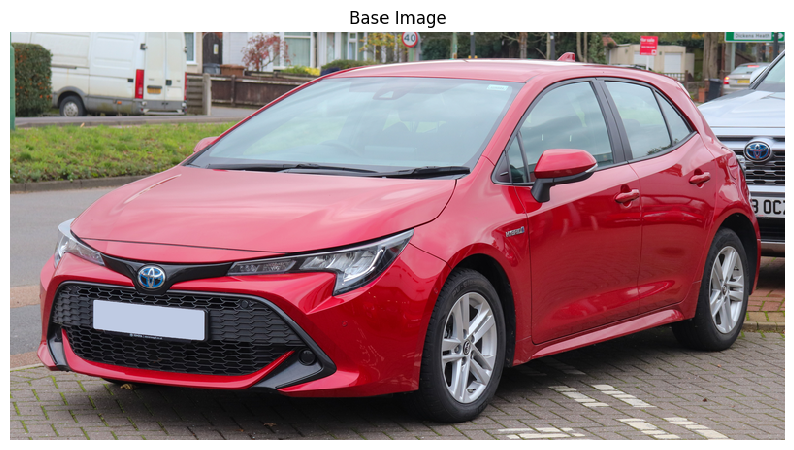

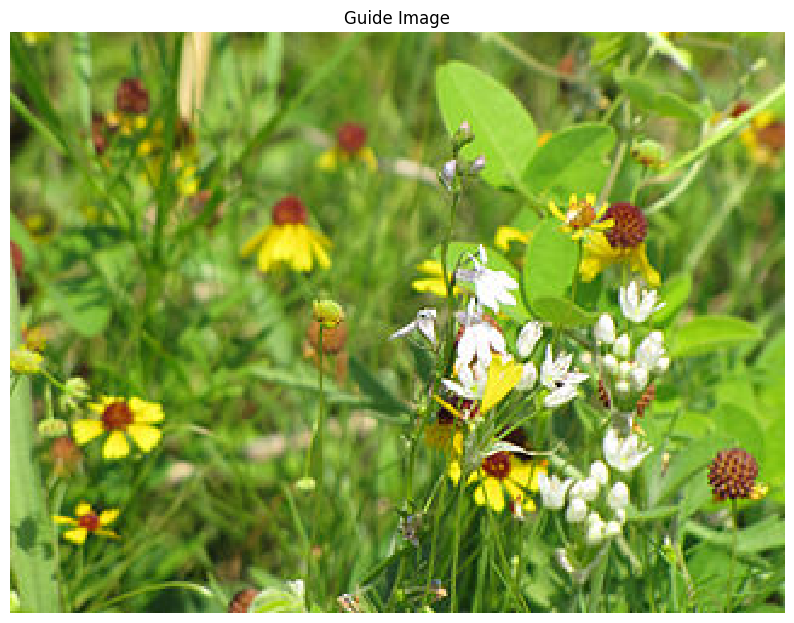

Model initialized with layers: ['Mixed_5b', 'Mixed_6a', 'Mixed_6b', 'Mixed_7c']
Initializing model and running a dummy forward pass to list available layers...

Available layers for dreaming:
- Mixed_5b
- Mixed_5b.branch1x1
- Mixed_5b.branch1x1.conv
- Mixed_5b.branch1x1.bn
- Mixed_5b.branch5x5_1
- Mixed_5b.branch5x5_1.conv
- Mixed_5b.branch5x5_1.bn
- Mixed_5b.branch5x5_2
- Mixed_5b.branch5x5_2.conv
- Mixed_5b.branch5x5_2.bn
- Mixed_5b.branch3x3dbl_1
- Mixed_5b.branch3x3dbl_1.conv
- Mixed_5b.branch3x3dbl_1.bn
- Mixed_5b.branch3x3dbl_2
- Mixed_5b.branch3x3dbl_2.conv
- Mixed_5b.branch3x3dbl_2.bn
- Mixed_5b.branch3x3dbl_3
- Mixed_5b.branch3x3dbl_3.conv
- Mixed_5b.branch3x3dbl_3.bn
- Mixed_5b.branch_pool
- Mixed_5b.branch_pool.conv
- Mixed_5b.branch_pool.bn
- Mixed_5c
- Mixed_5c.branch1x1
- Mixed_5c.branch1x1.conv
- Mixed_5c.branch1x1.bn
- Mixed_5c.branch5x5_1
- Mixed_5c.branch5x5_1.conv
- Mixed_5c.branch5x5_1.bn
- Mixed_5c.branch5x5_2
- Mixed_5c.branch5x5_2.conv
- Mixed_5c.branch5x5_2.bn
-

In [52]:
# Load the base and guide images
# Change these paths to your actual image files
base_img_path = "./img/car.jpg"  # Update this path
guide_img_path = "./img/flowers.jpg"  # Update this path

# Load and display images
try:
    base_img = load_and_resize_image(base_img_path, max_size=800)
    display_image(base_img, "Base Image")
    has_base = True
except FileNotFoundError:
    print(f"Base image '{base_img_path}' not found. Please provide a valid image path.")
    has_base = False
    base_img = None

try:
    guide_img = load_and_resize_image(guide_img_path, max_size=800)
    display_image(guide_img, "Guide Image")
    has_guide = True
except FileNotFoundError:
    print(f"Guide image '{guide_img_path}' not found. Will proceed without guide.")
    has_guide = False
    guide_img = None

# Initialize a DeepDream model to explore available layers
if has_base:
    dreamer = DeepDream()
    
    # Run a dummy forward pass to list available layers
    print("Initializing model and running a dummy forward pass to list available layers...")
    dummy_input = torch.zeros(1, 3, 299, 299).to(device)
    
    # Run a dummy forward pass to populate hooks
    with torch.no_grad():
        _ = dreamer.base_model(dummy_input)
    
    print("\nAvailable layers for dreaming:")
    available_layers = []
    for name, _ in dreamer.base_model.named_modules():
        if 'Mixed' in name or 'mixed' in name:
            available_layers.append(name)
            print(f"- {name}")
    
    # Predefined layer sets for different effects
    layer_sets = {
        "low_level": ['Mixed_5b', 'Mixed_6a'],  # More textural and pattern-based
        "mid_level": ['Mixed_6a', 'Mixed_6b', 'Mixed_6c'],  # Balance of patterns and objects
        "high_level": ['Mixed_6e', 'Mixed_7a', 'Mixed_7b'],  # More object/class features
        "very_high_level": ['Mixed_7b', 'Mixed_7c']  # Most object/class specific
    }
    
    print("\nPredefined layer sets:")
    for name, layers in layer_sets.items():
        print(f"- {name}: {layers}")

Applying enhanced DeepDream...
Model initialized with layers: ['Mixed_7b', 'Mixed_6e', 'Mixed_7c']
Processing octave 1/4


  0%|          | 0/25 [00:00<?, ?it/s]

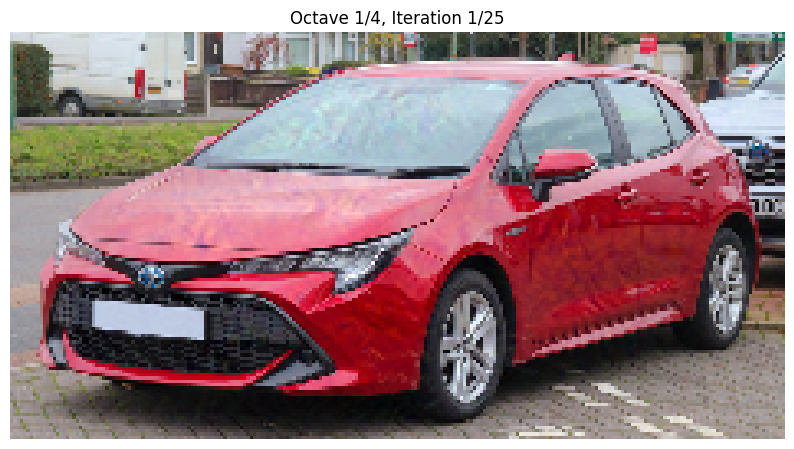

  4%|▍         | 1/25 [00:00<00:01, 15.28it/s]


RuntimeError: Input type (torch.cuda.DoubleTensor) and weight type (torch.cuda.FloatTensor) should be the same

In [53]:
# Apply enhanced DeepDream with correct PyTorch layer names
if has_base:
    print("Applying enhanced DeepDream...")
    
    # Use deeper layers for stronger visual effect
    enhanced_layers = ['Mixed_7b', 'Mixed_6e', 'Mixed_7c']
    
    # Reset the model with these specific layers
    enhanced_dreamer = DeepDream(layers=enhanced_layers)
    
    base_img_float32 = base_img.astype(np.float32)
    torch.set_default_dtype(torch.float32)
    
    # Apply DeepDream with stronger parameters - make sure to use the fixed preprocess method
    enhanced_result = enhanced_dreamer.deepdream(
        base_img_float32,
        octave_scale=1.5,
        num_octaves=4,
        iterations_per_octave=25,
        step_size=0.05,
        jitter=32,
        show_progress=True
    )
    
    # Save result
    output_path = os.path.join("dream_results", "enhanced_deepdream.jpg")
    Image.fromarray(enhanced_result).save(output_path)
    print(f"Enhanced DeepDream result saved to {output_path}")
    
    # Display side by side comparison
    compare_images(base_img, enhanced_result, titles=["Original Image", "Enhanced DeepDream"])

Applying guided DeepDream...
Model initialized with layers: ['mixed_6a', 'mixed_6b', 'mixed_6c']
Processing octave 1/4


  0%|          | 0/10 [00:00<?, ?it/s]

Available layers: []


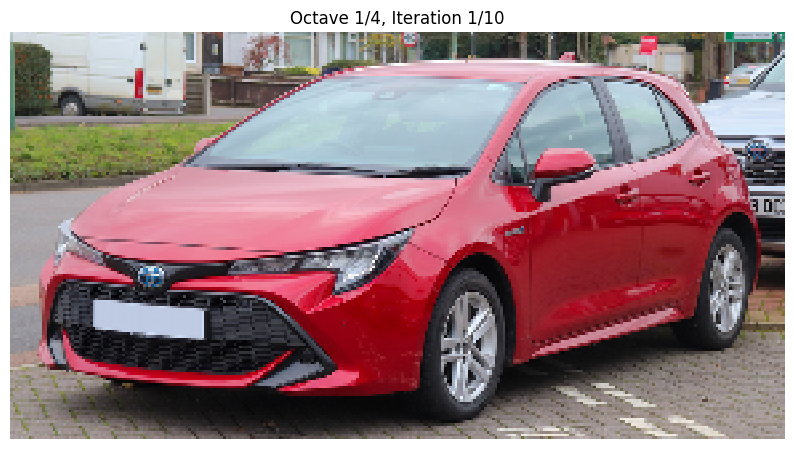

Available layers: []
Available layers: []


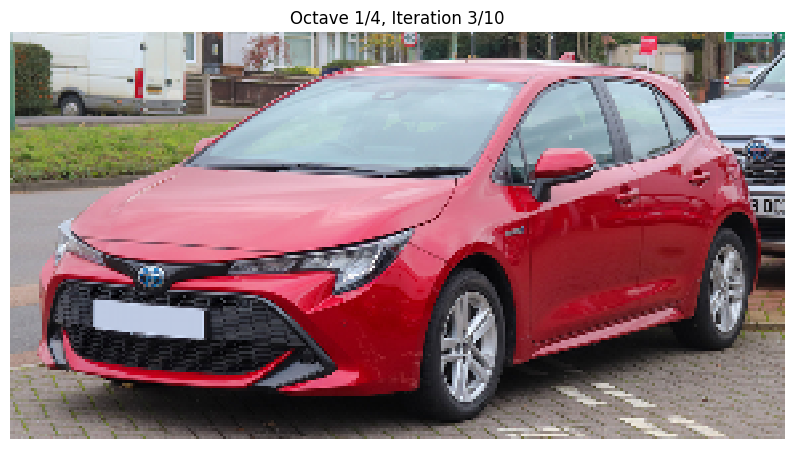

 40%|████      | 4/10 [00:00<00:00, 35.60it/s]

Available layers: []
Available layers: []


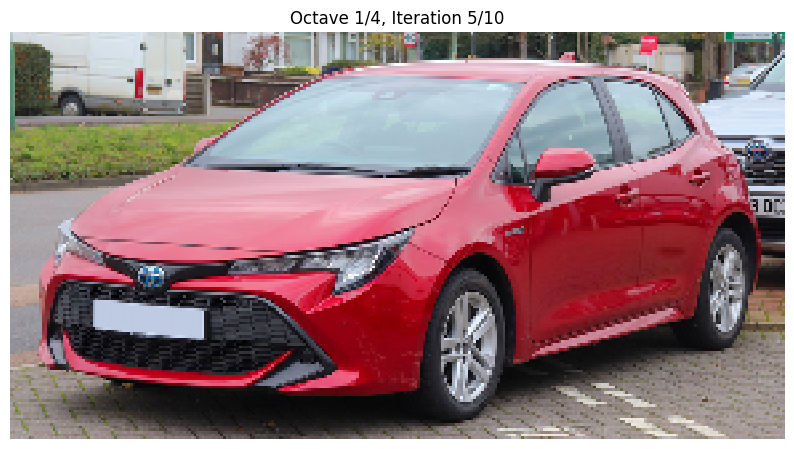

Available layers: []
Available layers: []


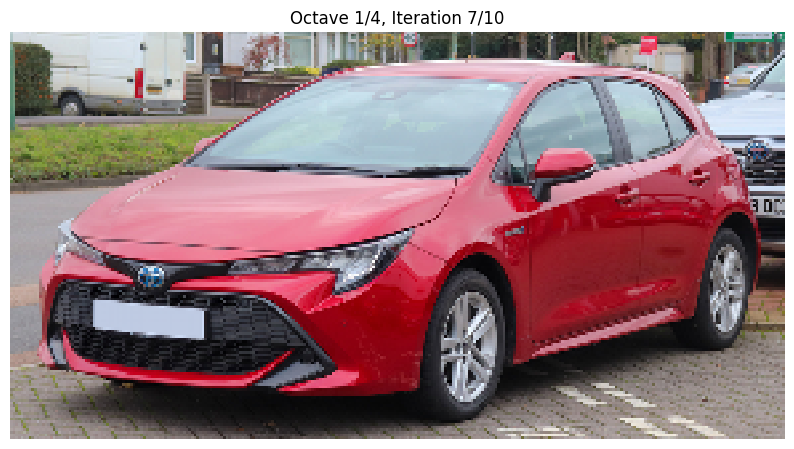

 80%|████████  | 8/10 [00:00<00:00, 36.20it/s]

Available layers: []
Available layers: []


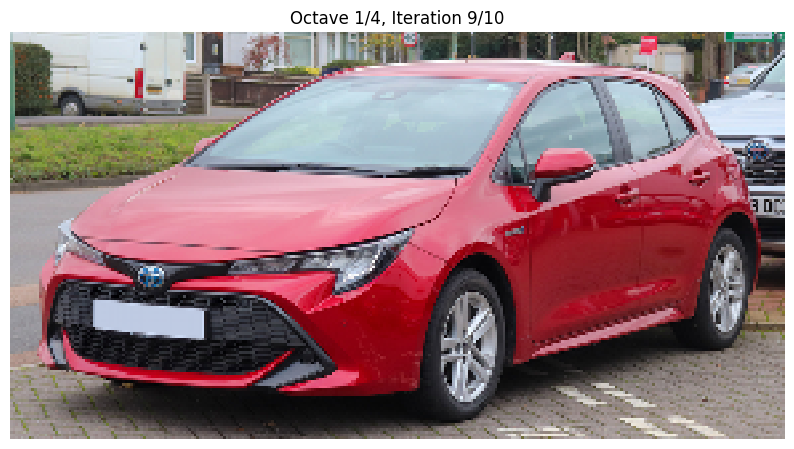

Available layers: []


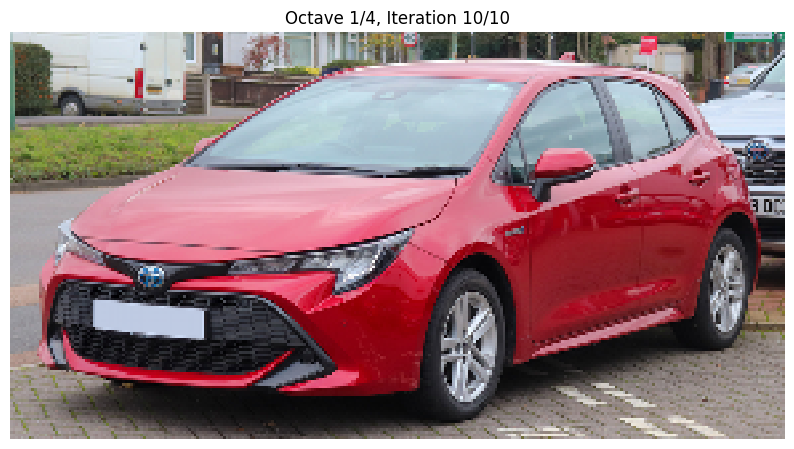

100%|██████████| 10/10 [00:00<00:00, 32.00it/s]


Processing octave 2/4


  0%|          | 0/10 [00:00<?, ?it/s]

Available layers: []


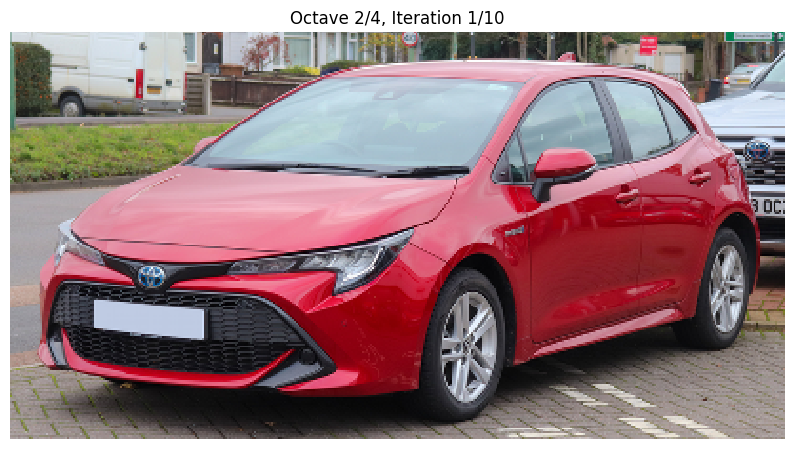

Available layers: []
Available layers: []


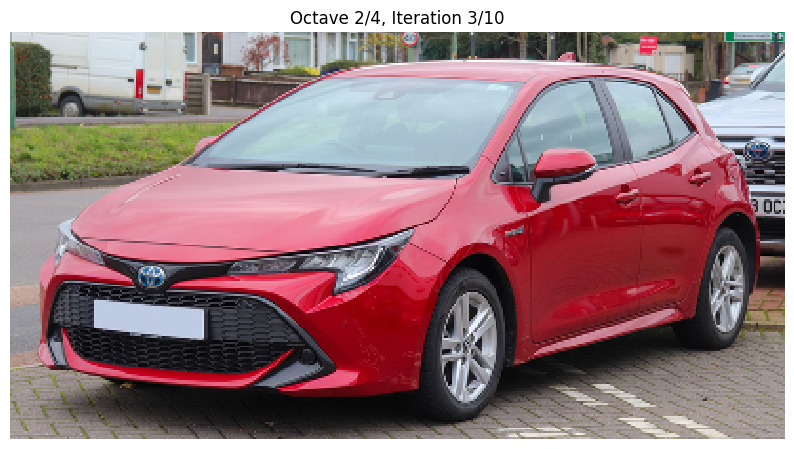

 30%|███       | 3/10 [00:00<00:00, 22.88it/s]

Available layers: []
Available layers: []


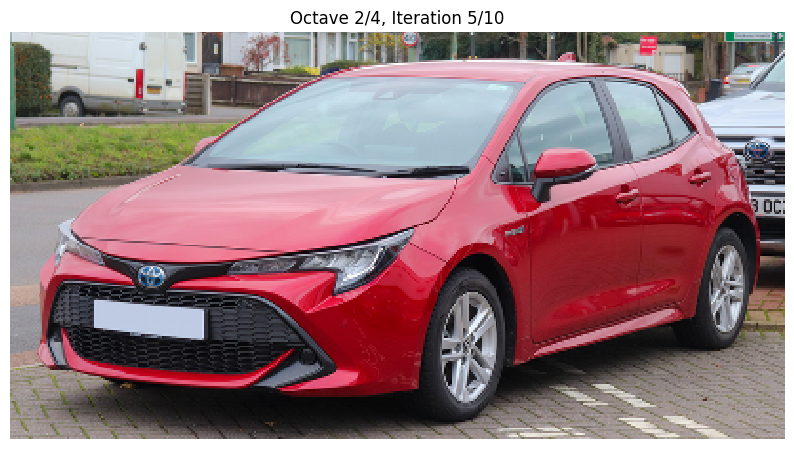

Available layers: []
Available layers: []


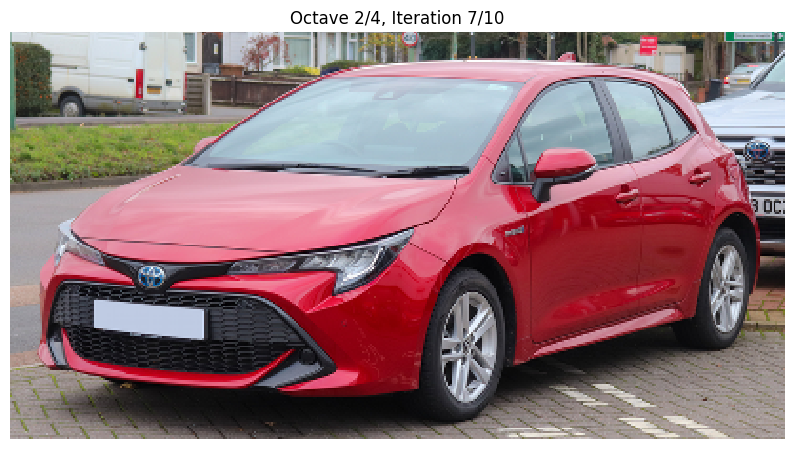

 70%|███████   | 7/10 [00:00<00:00, 26.79it/s]

Available layers: []
Available layers: []


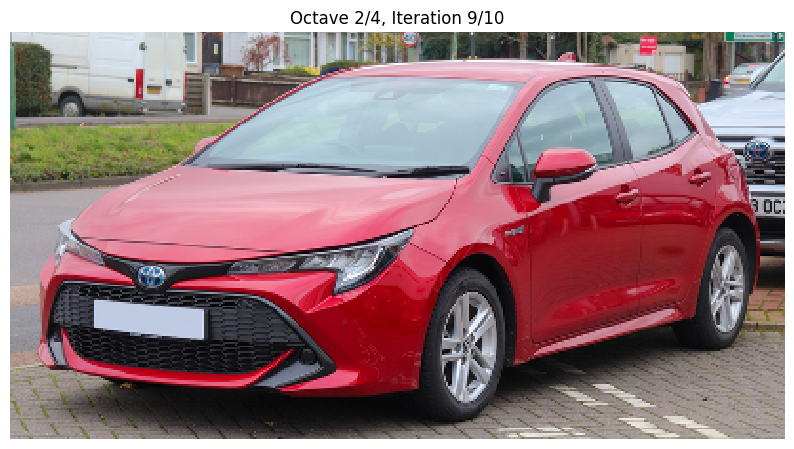

Available layers: []


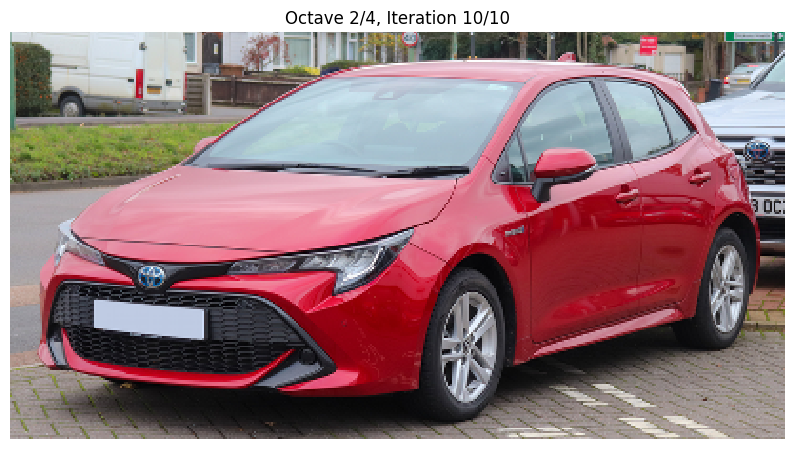

100%|██████████| 10/10 [00:00<00:00, 24.71it/s]


Processing octave 3/4


  0%|          | 0/10 [00:00<?, ?it/s]

Available layers: []


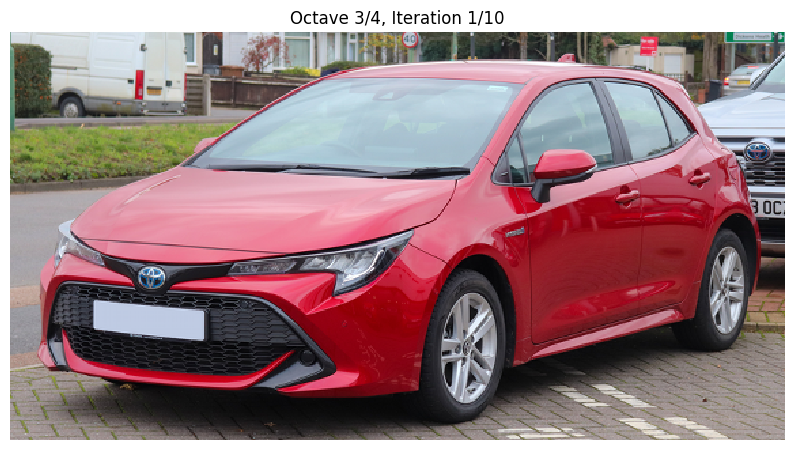

Available layers: []
Available layers: []


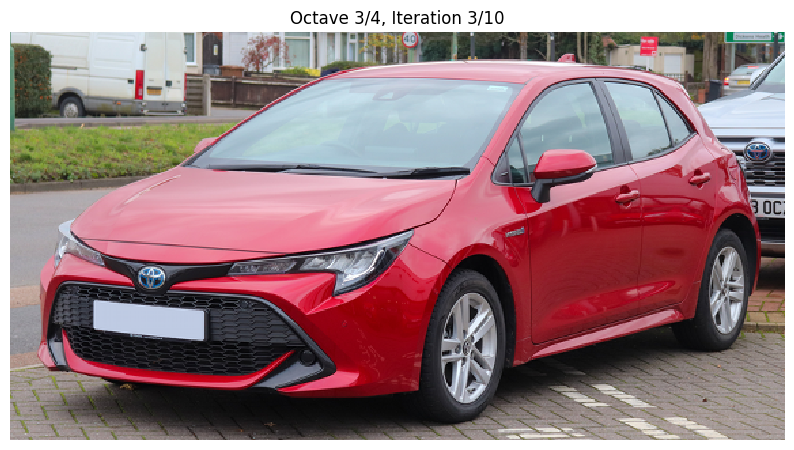

 30%|███       | 3/10 [00:00<00:00, 15.17it/s]

Available layers: []
Available layers: []


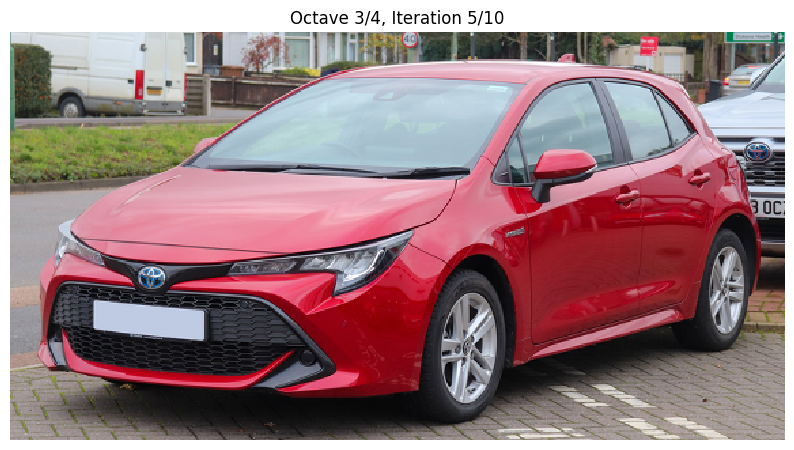

 60%|██████    | 6/10 [00:00<00:00, 21.37it/s]

Available layers: []
Available layers: []


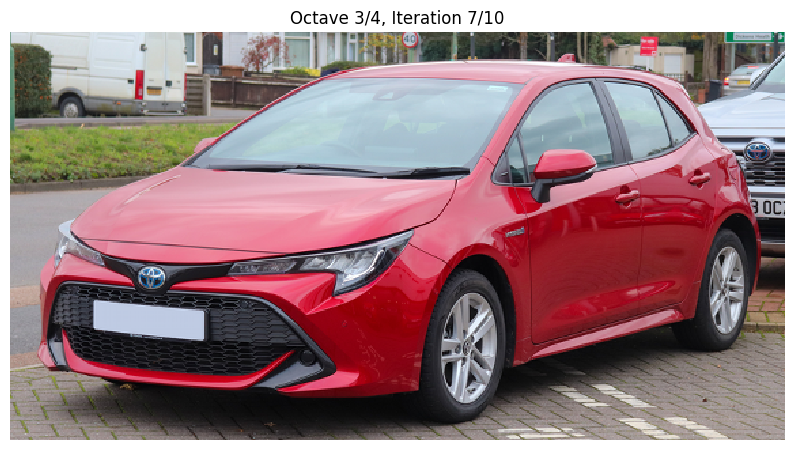

Available layers: []
Available layers: []


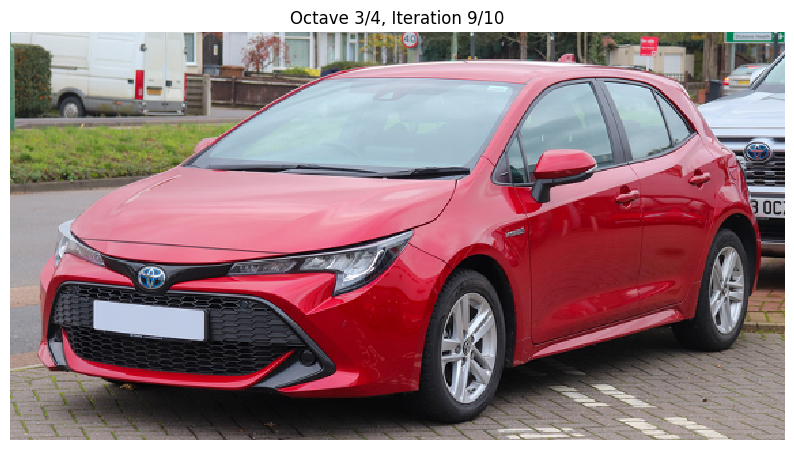

 90%|█████████ | 9/10 [00:00<00:00, 18.95it/s]

Available layers: []


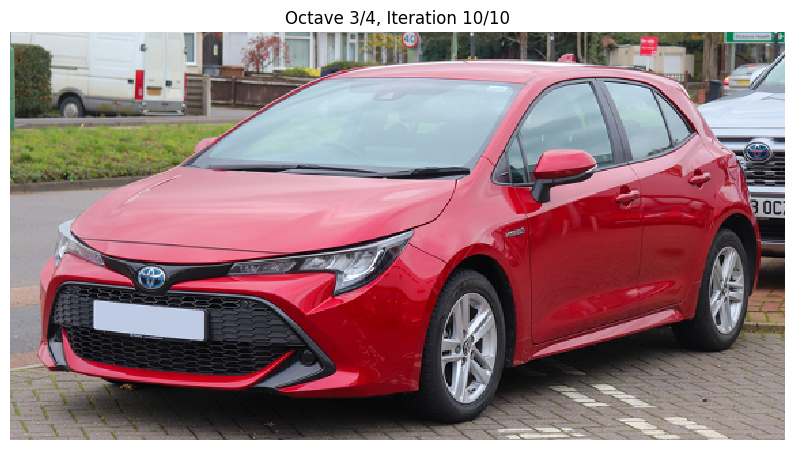

100%|██████████| 10/10 [00:00<00:00, 17.79it/s]


Processing octave 4/4


  0%|          | 0/10 [00:00<?, ?it/s]

Available layers: []


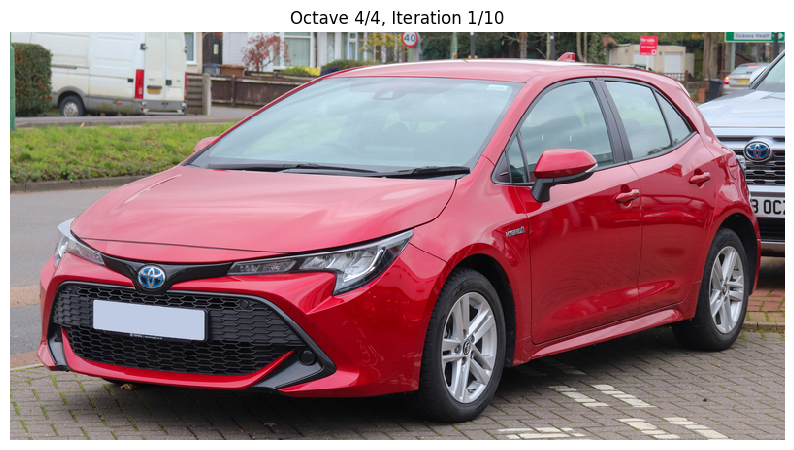

 10%|█         | 1/10 [00:00<00:01,  8.06it/s]

Available layers: []
Available layers: []


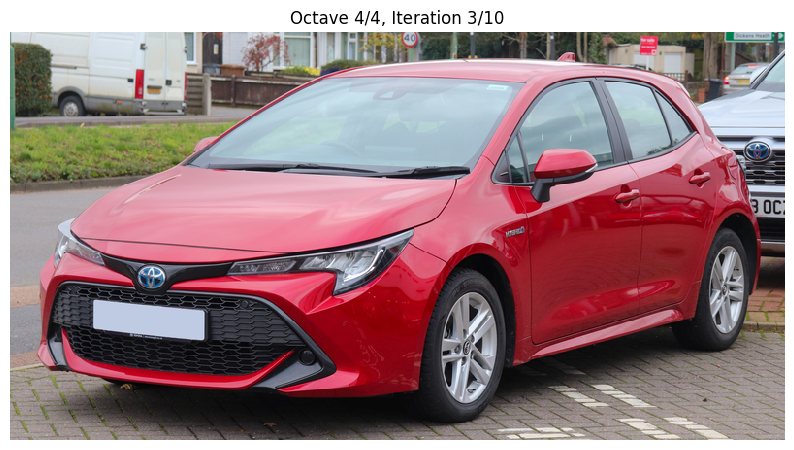

 30%|███       | 3/10 [00:00<00:00, 12.20it/s]

Available layers: []
Available layers: []


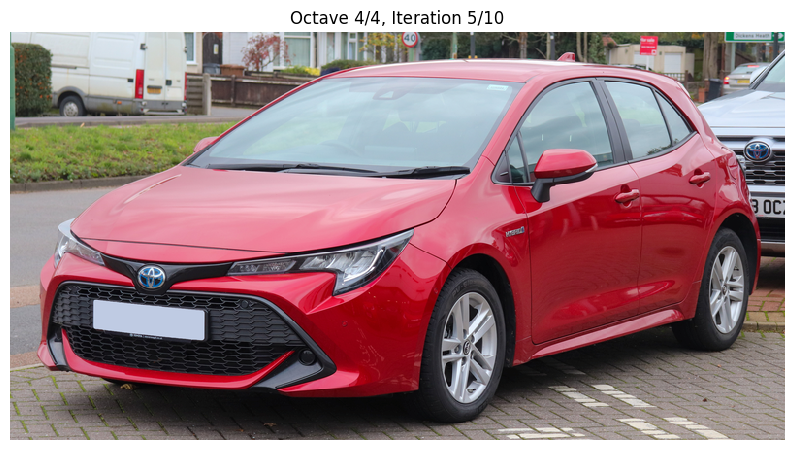

 50%|█████     | 5/10 [00:00<00:00, 13.34it/s]

Available layers: []
Available layers: []


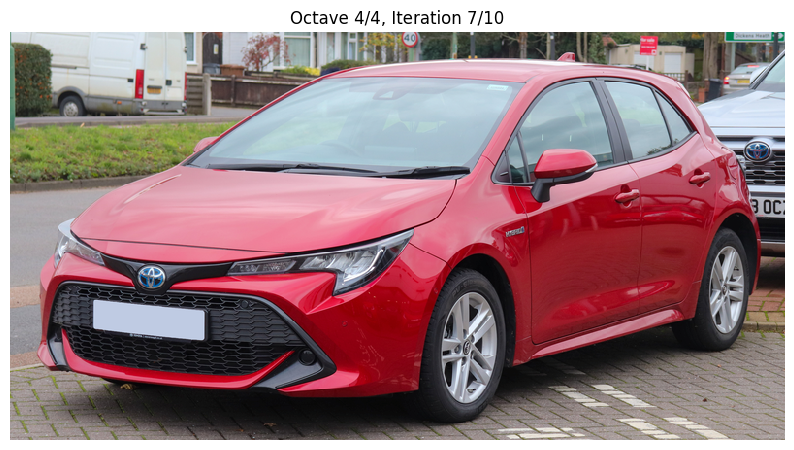

 70%|███████   | 7/10 [00:00<00:00, 14.02it/s]

Available layers: []
Available layers: []


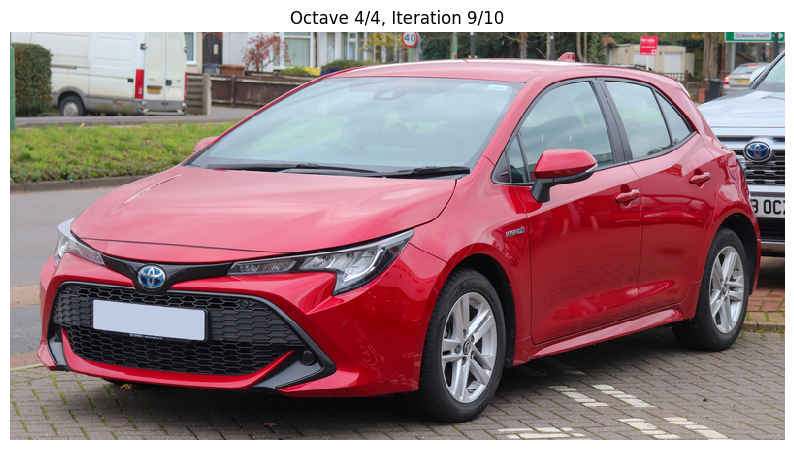

 90%|█████████ | 9/10 [00:00<00:00, 13.97it/s]

Available layers: []


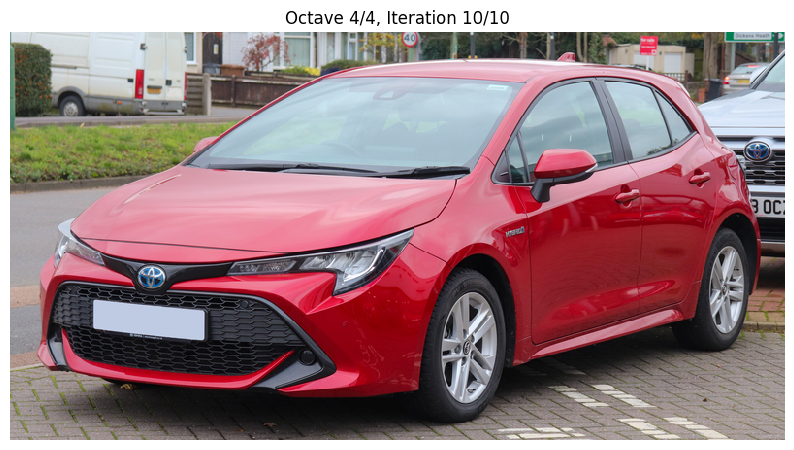

100%|██████████| 10/10 [00:00<00:00, 12.60it/s]


Guided DeepDream result saved to dream_results/guided_deepdream.jpg


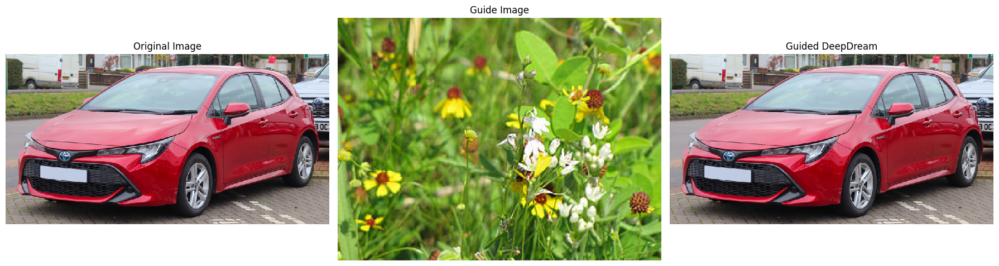

In [ ]:
# Apply guided DeepDream if guide image is available
if has_base and has_guide:
    print("Applying guided DeepDream...")
    
    # Reset the model with specific layers that work well for guided dreaming
    guided_dreamer = DeepDream(layers=layer_sets["mid_level"])
    
    # Apply guided DeepDream
    guided_result = guided_dreamer.deepdream(
        base_img,
        guide_img_array=guide_img,
        guidance_weight=0.5,  # Balance between normal dreaming and guide
        octave_scale=1.4,
        num_octaves=4,
        iterations_per_octave=10,
        step_size=0.01,
        jitter=32,
        show_progress=True
    )
    
    # Save result
    output_path = os.path.join("dream_results", "guided_deepdream.jpg")
    Image.fromarray(guided_result).save(output_path)
    print(f"Guided DeepDream result saved to {output_path}")
    
    # Display side by side comparison
    compare_images(base_img, guided_result, guide_img, 
                  titles=["Original Image", "Guide Image", "Guided DeepDream"])


Applying DeepDream with low_level layers...
Model initialized with layers: ['mixed_5b', 'mixed_6a']
Processing octave 1/3
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Processing octave 2/3
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Processing octave 3/3
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Available layers: []

Applying DeepDream with mid_level layers...
Model initialized with layers: ['mixed_6a', 'mixed_6b', 'mixed_6c']
Processing octave 1/3
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Processing octave 2/3
Avai

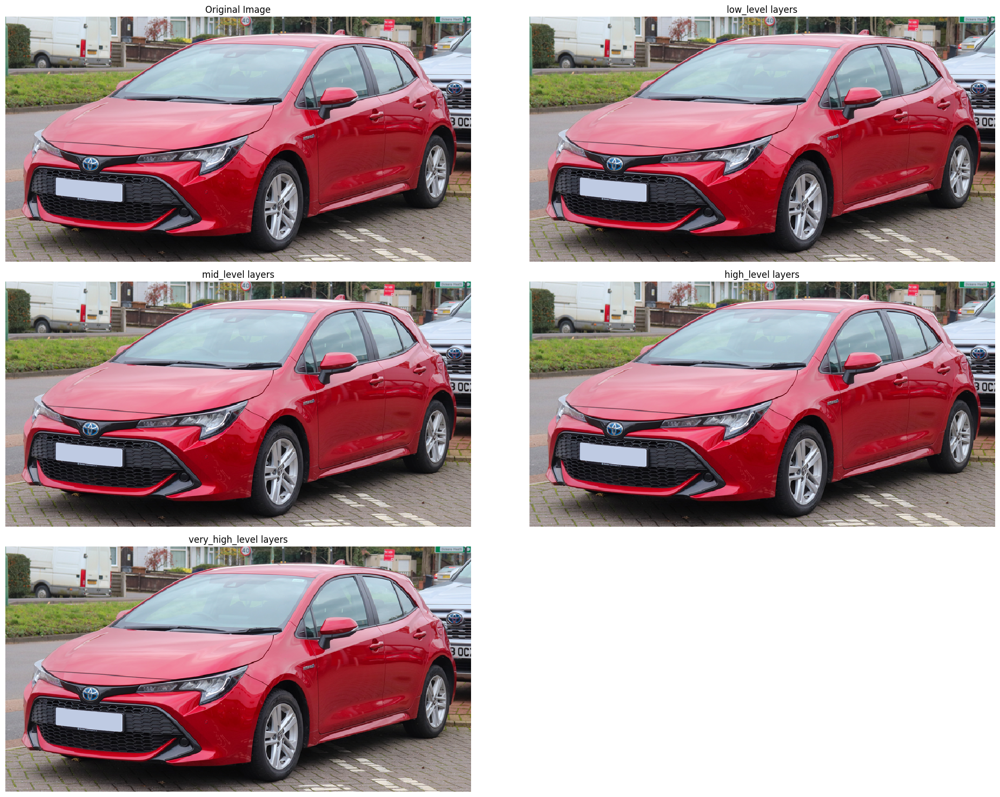

In [ ]:
# Experiment with different layer effects
if has_base:
    layer_experiments = ["low_level", "mid_level", "high_level", "very_high_level"]
    results = {}
    
    for layer_set_name in layer_experiments:
        print(f"\nApplying DeepDream with {layer_set_name} layers...")
        
        # Initialize model with this layer set
        layer_dreamer = DeepDream(layers=layer_sets[layer_set_name])
        
        # Apply DeepDream
        result = layer_dreamer.deepdream(
            base_img,
            octave_scale=1.4,
            num_octaves=3,  # Fewer octaves for quicker experimentation
            iterations_per_octave=8,  # Fewer iterations for quicker experimentation
            step_size=0.01,
            jitter=32,
            show_progress=False  # Don't show intermediate results for cleaner output
        )
        
        # Save result
        output_path = os.path.join("dream_results", f"{layer_set_name}_deepdream.jpg")
        Image.fromarray(result).save(output_path)
        
        # Store result for display
        results[layer_set_name] = result
    
    # Display all results together
    plt.figure(figsize=(20, 15))
    
    # Display original
    plt.subplot(3, 2, 1)
    plt.imshow(base_img)
    plt.title("Original Image")
    plt.axis('off')
    
    # Display results for each layer set
    for i, (layer_set_name, result) in enumerate(results.items(), 2):
        plt.subplot(3, 2, i)
        plt.imshow(result)
        plt.title(f"{layer_set_name} layers")
        plt.axis('off')
    
    plt.tight_layout()
    plt.savefig(os.path.join("dream_results", "layer_comparison.jpg"), dpi=300)
    plt.show()

Creating DeepDream animation with zoom effect...
Model initialized with layers: ['mixed_6a', 'mixed_6b', 'mixed_6c']
Processing frame 1/10
Processing octave 1/3
Available layers: []


/home/nevin/miniconda3/envs/cvai/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/nevin/miniconda3/envs/cvai/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Available layers: []
Available layers: []
Available layers: []
Available layers: []
Processing octave 2/3
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Processing octave 3/3
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Processing frame 2/10
Processing octave 1/3
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Processing octave 2/3
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Processing octave 3/3
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Processing frame 3/10
Processing octave 1/3
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Processing octave 2/3
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Avai

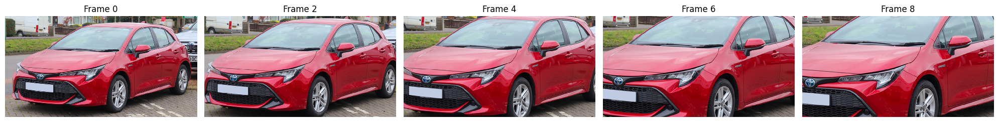

In [ ]:
# Create a DeepDream animation with zoom effect
if has_base:
    print("Creating DeepDream animation with zoom effect...")
    
    # Parameters for animation
    frame_count = 10  # Number of frames to generate
    zoom = 0.05  # Amount to zoom in each frame
    frames_dir = os.path.join("dream_results", "frames")
    os.makedirs(frames_dir, exist_ok=True)
    
    # Initialize model for animation
    animation_dreamer = DeepDream(layers=layer_sets["mid_level"])
    
    # Initialize with base image
    frame = base_img.copy()
    h, w = frame.shape[:2]
    
    # Create frames
    frames = []
    for i in range(frame_count):
        print(f"Processing frame {i+1}/{frame_count}")
        
        # Apply DeepDream
        frame = animation_dreamer.deepdream(
            frame,
            octave_scale=1.3,
            num_octaves=3,
            iterations_per_octave=5,
            step_size=0.01,
            jitter=32,
            show_progress=False
        )
        
        # Save frame
        frame_path = os.path.join(frames_dir, f"frame_{i:04d}.jpg")
        Image.fromarray(frame).save(frame_path)
        frames.append(frame)
        
        # Zoom in for next frame
        frame = np.array(Image.fromarray(frame).resize(
            (int(w * (1 + zoom)), int(h * (1 + zoom))), 
            Image.LANCZOS
        ))
        
        # Crop to original size from center
        y_crop = (frame.shape[0] - h) // 2
        x_crop = (frame.shape[1] - w) // 2
        frame = frame[y_crop:y_crop+h, x_crop:x_crop+w]
    
    print(f"Animation frames saved to {frames_dir}/")
    
    # Display the frames
    plt.figure(figsize=(20, 6))
    display_frames = frames[::2]  # Show every other frame to fit better
    num_frames = len(display_frames)
    
    for i, frame in enumerate(display_frames):
        plt.subplot(1, num_frames, i+1)
        plt.imshow(frame)
        plt.title(f"Frame {i*2}")
        plt.axis('off')
    
    plt.tight_layout()
    plt.savefig(os.path.join("dream_results", "animation_frames.jpg"), dpi=300)
    plt.show()

Experimenting with different parameter settings...
Model initialized with layers: ['mixed_6a', 'mixed_6b', 'mixed_6c']

Running experiment: high_step_size
Processing octave 1/4
Available layers: []
Available layers: []
Available layers: []


/home/nevin/miniconda3/envs/cvai/lib/python3.9/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/nevin/miniconda3/envs/cvai/lib/python3.9/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Available layers: []
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Processing octave 2/4
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Processing octave 3/4
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Processing octave 4/4
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Available layers: []

Running experiment: low_step_size
Processing octave 1/4
Available layers: []
Available layers: []
Available layers: []
Available layers: []
Available layers

ValueError: num must be an integer with 1 <= num <= 6, not 8

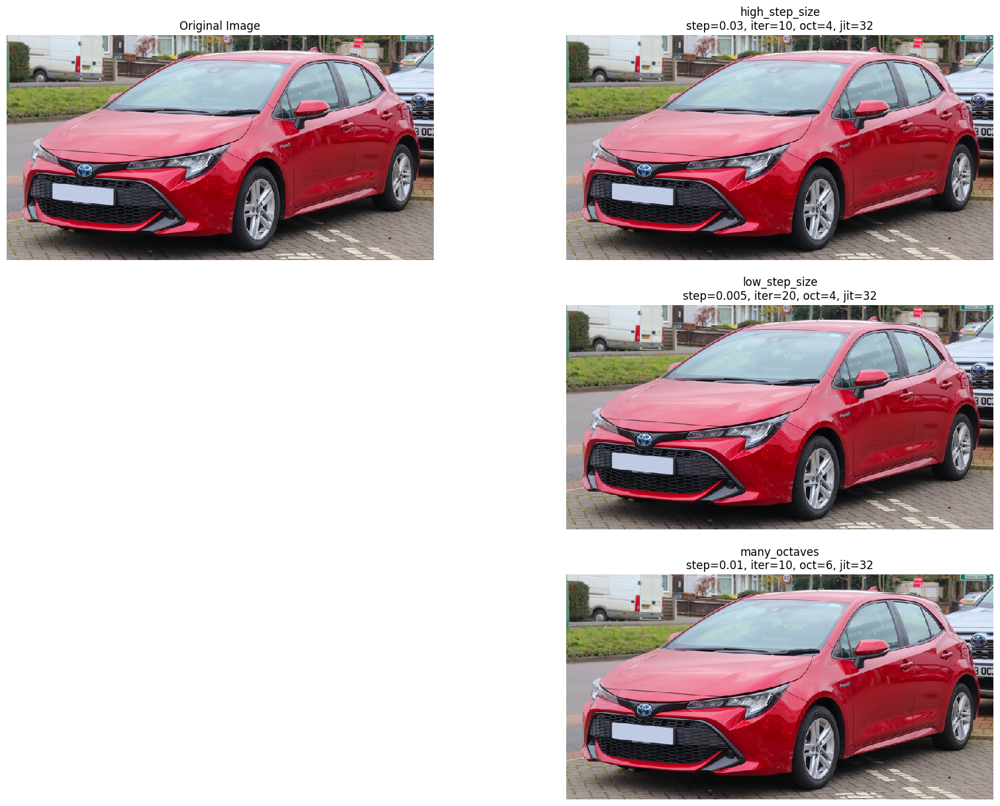

In [ ]:
# Experiment with different parameter settings
if has_base:
    print("Experimenting with different parameter settings...")
    
    # Define experiments
    parameter_experiments = [
        {"name": "high_step_size", "step_size": 0.03, "iterations": 10},
        {"name": "low_step_size", "step_size": 0.005, "iterations": 20},
        {"name": "many_octaves", "num_octaves": 6, "step_size": 0.01},
        {"name": "high_jitter", "jitter": 64, "step_size": 0.01}
    ]
    
    # Same model for all experiments
    param_dreamer = DeepDream(layers=layer_sets["mid_level"])
    
    # Run experiments
    param_results = {}
    for exp in parameter_experiments:
        name = exp["name"]
        print(f"\nRunning experiment: {name}")
        
        # Extract parameters with defaults
        step_size = exp.get("step_size", 0.01)
        iterations = exp.get("iterations", 10)
        num_octaves = exp.get("num_octaves", 4)
        jitter = exp.get("jitter", 32)
        
        # Apply DeepDream with these parameters
        result = param_dreamer.deepdream(
            base_img,
            octave_scale=1.4,
            num_octaves=num_octaves,
            iterations_per_octave=iterations,
            step_size=step_size,
            jitter=jitter,
            show_progress=False
        )
        
        # Save result
        output_path = os.path.join("dream_results", f"{name}_deepdream.jpg")
        Image.fromarray(result).save(output_path)
        
        # Store result for display
        param_results[name] = result
        param_results[f"{name}_desc"] = f"step={step_size}, iter={iterations}, oct={num_octaves}, jit={jitter}"
    
    # Display all results together
    plt.figure(figsize=(20, 15))
    
    # Display original
    plt.subplot(3, 2, 1)
    plt.imshow(base_img)
    plt.title("Original Image")
    plt.axis('off')
    
    # Display results for each parameter setting
    for i, (name, result) in enumerate(param_results.items(), 2):
        if "_desc" not in name:
            plt.subplot(3, 2, i)
            plt.imshow(result)
            plt.title(f"{name}\n{param_results[name+'_desc']}")
            plt.axis('off')
    
    plt.tight_layout()
    plt.savefig(os.path.join("dream_results", "parameter_comparison.jpg"), dpi=300)
    plt.show()

In [ ]:
# Create more of a style transfer effect with stronger guidance
if has_base and has_guide:
    print("Creating style transfer effect with stronger guidance...")
    
    # Initialize model with layers that work well for style transfer
    style_dreamer = DeepDream(layers=['mixed_5b', 'mixed_6a', 'mixed_6b', 'mixed_6c'])
    
    # Apply guided dreaming with high guidance weight
    style_result = style_dreamer.deepdream(
        base_img,
        guide_img_array=guide_img,
        guidance_weight=0.8,  # Higher weight for more guide influence
        octave_scale=1.4,
        num_octaves=5,        # More octaves for better detail
        iterations_per_octave=15, # More iterations for stronger effect
        step_size=0.01,
        jitter=32,
        show_progress=True
    )
    
    # Save result
    output_path = os.path.join("dream_results", "style_transfer_effect.jpg")
    Image.fromarray(style_result).save(output_path)
    print(f"Style transfer effect saved to {output_path}")
    
    # Display side by side comparison
    compare_images(base_img, style_result, guide_img, 
                  titles=["Original Image", "Style Source", "Style Transfer Effect"])

In [ ]:
# Create a custom function that makes it easy to apply deepdream with different settings
def custom_deepdream(base_img_path, output_path=None, guide_img_path=None, 
                    effect_type="standard", layer_set="mid_level", 
                    guidance_weight=0.5, octaves=4, iterations=10, 
                    step_size=0.01, jitter=32, show_result=True):
    """
    Apply DeepDream with customizable settings.
    
    Args:
        base_img_path: Path to the base image
        output_path: Path to save the result (optional)
        guide_img_path: Path to the guide image (optional)
        effect_type: Type of effect to apply ("standard", "intense", "subtle", "textural", "object")
        layer_set: Layer set to use ("low_level", "mid_level", "high_level", "very_high_level")
        guidance_weight: Weight for guided dreaming (0-1)
        octaves: Number of octaves
        iterations: Number of iterations per octave
        step_size: Gradient ascent step size
        jitter: Amount of jitter
        show_result: Whether to display the result
        
    Returns:
        Resulting image array
    """
    # Layer sets
    layer_sets = {
        "low_level": ['mixed_5b', 'mixed_6a'],  # More textural and pattern-based
        "mid_level": ['mixed_6a', 'mixed_6b', 'mixed_6c'],  # Balance of patterns and objects
        "high_level": ['mixed_6e', 'mixed_7a', 'mixed_7b'],  # More object/class features
        "very_high_level": ['mixed_7b', 'mixed_7c']  # Most object/class specific
    }
    
    # Load images
    base_img = load_and_resize_image(base_img_path, max_size=800)
    guide_img = None
    if guide_img_path:
        try:
            guide_img = load_and_resize_image(guide_img_path, max_size=800)
        except FileNotFoundError:
            print(f"Guide image '{guide_img_path}' not found. Proceeding without guide.")
    
    # Configure effect type
    if effect_type == "intense":
        octaves = 5
        iterations = 15
        step_size = 0.02
    elif effect_type == "subtle":
        octaves = 3
        iterations = 8
        step_size = 0.008
    elif effect_type == "textural":
        layer_set = "low_level"
        octaves = 4
        iterations = 12
    elif effect_type == "object":
        layer_set = "high_level"
        octaves = 4
        iterations = 10
    
    # Initialize model with selected layers
    custom_dreamer = DeepDream(layers=layer_sets[layer_set])
    
    # Apply DeepDream
    result = custom_dreamer.deepdream(
        base_img,
        guide_img_array=guide_img,
        guidance_weight=guidance_weight if guide_img is not None else 0.0,
        octave_scale=1.4,
        num_octaves=octaves,
        iterations_per_octave=iterations,
        step_size=step_size,
        jitter=jitter,
        show_progress=True
    )
    
    # Save result if output path provided
    if output_path:
        Image.fromarray(result).save(output_path)
        print(f"Result saved to {output_path}")
    
    # Display result
    if show_result:
        if guide_img is not None:
            compare_images(base_img, result, guide_img,
                          titles=["Original", "Guide", f"{effect_type.capitalize()} Effect"])
        else:
            compare_images(base_img, result,
                          titles=["Original", f"{effect_type.capitalize()} Effect"])
    
    return result

# Example usage of the custom function
if has_base:
    # Use the function with different settings
    print("Creating custom dream effects...")
    
    # Intense effect
    intense_result = custom_deepdream(
        base_img_path=base_img_path,
        output_path=os.path.join("dream_results", "intense_effect.jpg"),
        guide_img_path=guide_img_path if has_guide else None,
        effect_type="intense",
        layer_set="mid_level"
    )
    
    # Textural effect
    textural_result = custom_deepdream(
        base_img_path=base_img_path,
        output_path=os.path.join("dream_results", "textural_effect.jpg"),
        guide_img_path=None,  # No guide for pure texture
        effect_type="textural",
        layer_set="low_level" 
    )

In [ ]:
# Generate a highly stylized effect using multiple passes and strong parameters
if has_base and has_guide:
    print("Creating highly stylized effect...")
    
    # Start with the base image
    stylized_img = base_img.copy()
    
    # First pass - apply guided dreaming with low-level features
    low_level_dreamer = DeepDream(layers=['mixed_5b', 'mixed_6a'])
    
    stylized_img = low_level_dreamer.deepdream(
        stylized_img,
        guide_img_array=guide_img,
        guidance_weight=0.7,
        octave_scale=1.4,
        num_octaves=4,
        iterations_per_octave=12,
        step_size=0.015,
        jitter=32,
        show_progress=True
    )
    
    # Second pass - enhance with mid-level features
    mid_level_dreamer = DeepDream(layers=['mixed_6a', 'mixed_6b', 'mixed_6c'])
    
    stylized_img = mid_level_dreamer.deepdream(
        stylized_img,
        guide_img_array=guide_img,
        guidance_weight=0.5,
        octave_scale=1.3,
        num_octaves=3,
        iterations_per_octave=8,
        step_size=0.01,
        jitter=32,
        show_progress=True
    )
    
    # Final pass - subtle high-level features to add some object elements
    high_level_dreamer = DeepDream(layers=['mixed_6e', 'mixed_7a', 'mixed_7b'])
    
    final_stylized = high_level_dreamer.deepdream(
        stylized_img,
        guide_img_array=guide_img,
        guidance_weight=0.3,
        octave_scale=1.2,
        num_octaves=2,
        iterations_per_octave=5,
        step_size=0.005,
        jitter=16,
        show_progress=True
    )
    
    # Save result
    output_path = os.path.join("dream_results", "highly_stylized.jpg")
    Image.fromarray(final_stylized).save(output_path)
    print(f"Highly stylized result saved to {output_path}")
    
    # Display the progression
    plt.figure(figsize=(20, 10))
    
    plt.subplot(2, 2, 1)
    plt.imshow(base_img)
    plt.title("Original Image")
    plt.axis('off')
    
    plt.subplot(2, 2, 2)
    plt.imshow(guide_img)
    plt.title("Guide Image")
    plt.axis('off')
    
    plt.subplot(2, 2, 3)
    plt.imshow(stylized_img)
    plt.title("Intermediate Result")
    plt.axis('off')
    
    plt.subplot(2, 2, 4)
    plt.imshow(final_stylized)
    plt.title("Final Highly Stylized Result")
    plt.axis('off')
    
    plt.tight_layout()
    plt.savefig(os.path.join("dream_results", "stylization_process.jpg"), dpi=300)
    plt.show()

In [ ]:
# Create a gallery of all generated images
print("Creating gallery of all generated images...")

# Find all images in the dream_results directory
result_files = [f for f in os.listdir("dream_results") if f.endswith(('.jpg', '.png')) and 
                not f.startswith('frames') and not os.path.isdir(os.path.join("dream_results", f))]

# Sort them for consistent display
result_files.sort()

# Determine grid size
num_images = len(result_files)
grid_size = int(np.ceil(np.sqrt(num_images)))

# Create gallery
plt.figure(figsize=(20, 20))

for i, filename in enumerate(result_files):
    if i < grid_size * grid_size:  # Limit to grid size
        image_path = os.path.join("dream_results", filename)
        img = np.array(Image.open(image_path).convert('RGB'))
        
        plt.subplot(grid_size, grid_size, i+1)
        plt.imshow(img)
        plt.title(filename.replace('.jpg', '').replace('_', ' ').title())
        plt.axis('off')

plt.tight_layout()
plt.savefig(os.path.join("dream_results", "gallery.jpg"), dpi=300)
plt.show()

print("DeepDream experiments complete! All results saved to the 'dream_results' directory.")

In [ ]:
# Guided dream experiment with multiple reference images (similar to your TensorFlow example)
if has_base:
    print("Running guided dream experiment with multiple classes...")
    
    # Define different guide image paths - update these to your actual paths
    guide_paths = {
        "flowers": "flowers.jpg",
        "animals": "animals.jpg",
        "landscapes": "landscapes.jpg",
        "patterns": "patterns.jpg"
    }
    
    # Dictionary to store valid guides
    valid_guides = {}
    
    # Try to load each guide image
    for name, path in guide_paths.items():
        try:
            guide = load_and_resize_image(path, max_size=800)
            valid_guides[name] = guide
            print(f"Loaded guide image for {name}")
        except FileNotFoundError:
            print(f"Guide image for {name} not found at path {path}")
    
    # If we have at least one valid guide, proceed
    if valid_guides:
        # Display available guides
        plt.figure(figsize=(15, 5))
        for i, (name, guide) in enumerate(valid_guides.items()):
            plt.subplot(1, len(valid_guides), i+1)
            plt.imshow(guide)
            plt.title(f"Guide: {name}")
            plt.axis('off')
        plt.tight_layout()
        plt.show()
        
        # Process each guide with different layer sets
        results = {}
        for name, guide in valid_guides.items():
            print(f"\nProcessing guided dream with {name} guide...")
            
            # Choose appropriate layers based on guide type
            if name == "flowers" or name == "animals":
                # For recognizable objects, use higher level features
                layers = ['mixed_6e', 'mixed_7a', 'mixed_7b']
            elif name == "landscapes":
                # For scenes, use a mix of mid and high level
                layers = ['mixed_6b', 'mixed_6e', 'mixed_7a']
            else:
                # For patterns or textures, use lower level features
                layers = ['mixed_5b', 'mixed_6a', 'mixed_6b']
            
            # Create dreamer with these layers
            dreamer = DeepDream(layers=layers)
            
            # Apply guided dreaming
            result = dreamer.deepdream(
                base_img,
                guide_img_array=guide,
                guidance_weight=0.6,
                octave_scale=1.4,
                num_octaves=4,
                iterations_per_octave=12,
                step_size=0.01,
                jitter=32,
                show_progress=True
            )
            
            # Save result
            output_path = os.path.join("dream_results", f"{name}_guided_dream.jpg")
            Image.fromarray(result).save(output_path)
            print(f"Result saved to {output_path}")
            
            # Store for display
            results[name] = result
        
        # Display all results in a grid
        plt.figure(figsize=(20, 10))
        
        # Original image
        plt.subplot(2, len(valid_guides) + 1, 1)
        plt.imshow(base_img)
        plt.title("Original Image")
        plt.axis('off')
        
        # Results
        for i, (name, result) in enumerate(results.items(), 1):
            # Display guide
            plt.subplot(2, len(valid_guides) + 1, i + 1)
            plt.imshow(valid_guides[name])
            plt.title(f"Guide: {name}")
            plt.axis('off')
            
            # Display result
            plt.subplot(2, len(valid_guides) + 1, i + len(valid_guides) + 1)
            plt.imshow(result)
            plt.title(f"Result: {name}")
            plt.axis('off')
        
        plt.tight_layout()
        plt.savefig(os.path.join("dream_results", "multi_guide_comparison.jpg"), dpi=300)
        plt.show()
    else:
        print("No valid guide images found. Please provide at least one guide image.")

In [ ]:
# Create an animation that transitions between different dream styles
if has_base and len(valid_guides) >= 2:
    print("Creating style transition animation...")
    
    # Choose two guides to transition between
    guides = list(valid_guides.items())[:2]  # Take first two guides
    guide1_name, guide1 = guides[0]
    guide2_name, guide2 = guides[1]
    
    # Parameters
    frames_count = 10
    frames_dir = os.path.join("dream_results", "transition_frames")
    os.makedirs(frames_dir, exist_ok=True)
    
    # Use the same layers for consistent effect
    layers = ['mixed_6a', 'mixed_6b', 'mixed_6e']
    dreamer = DeepDream(layers=layers)
    
    # Generate frames with gradually changing guidance weight
    frames = []
    for i in range(frames_count):
        # Calculate weights for transition
        weight1 = 1.0 - (i / (frames_count - 1))
        weight2 = i / (frames_count - 1)
        print(f"Frame {i+1}/{frames_count}: {guide1_name} weight = {weight1:.2f}, {guide2_name} weight = {weight2:.2f}")
        
        # First apply guide 1
        intermediate = dreamer.deepdream(
            base_img,
            guide_img_array=guide1,
            guidance_weight=0.7 * weight1,
            octave_scale=1.3,
            num_octaves=3,
            iterations_per_octave=8,
            step_size=0.01,
            jitter=32,
            show_progress=False
        )
        
        # Then apply guide 2 to the result
        frame = dreamer.deepdream(
            intermediate,
            guide_img_array=guide2,
            guidance_weight=0.7 * weight2,
            octave_scale=1.3,
            num_octaves=3,
            iterations_per_octave=8,
            step_size=0.01,
            jitter=32,
            show_progress=False
        )
        
        # Save frame
        frame_path = os.path.join(frames_dir, f"frame_{i:04d}.jpg")
        Image.fromarray(frame).save(frame_path)
        frames.append(frame)
    
    print(f"Transition frames saved to {frames_dir}/")
    
    # Display transition frames
    plt.figure(figsize=(20, 6))
    
    for i, frame in enumerate(frames):
        plt.subplot(2, frames_count//2, i+1)
        plt.imshow(frame)
        plt.title(f"Frame {i+1}")
        plt.axis('off')
    
    plt.tight_layout()
    plt.savefig(os.path.join("dream_results", "style_transition.jpg"), dpi=300)
    plt.show()